# CelebA-HQ sampling

Regenerates `checkpoints/samples.pt`/`samples_finetuned.pt` locally, same EDM Heun sampler as
`sample_celeba_hq_edm.py`. Needed since the checkpoint on disk is newer than the samples file
paired with it. Set `MODEL` to pick which checkpoint. Includes its own memorization check.

In [1]:
import os
import torch
import torchvision.utils as vutils
from diffusers import UNet2DModel, AutoencoderKL

torch.backends.cuda.enable_cudnn_sdp(False)  # see train_celeba_hq_edm.py's docstring

MODEL = "finetuned"  # "finetuned" or "base"

CLUSTER_CODES = "."
device = os.environ.get("DEVICE") or ("mps" if torch.backends.mps.is_available() else ("cuda" if torch.cuda.is_available() else "cpu"))

ckpt_path = f"{CLUSTER_CODES}/checkpoints/" + ("celeba_hq_edm_finetuned.pt" if MODEL == "finetuned" else "celeba_hq_edm.pt")
vae_dir = f"{CLUSTER_CODES}/pretrained/sd-vae-ft-mse"
out_path = f"{CLUSTER_CODES}/checkpoints/" + ("samples_finetuned.pt" if MODEL == "finetuned" else "samples.pt")
grid_path = f"{CLUSTER_CODES}/checkpoints/" + ("samples_finetuned_grid.png" if MODEL == "finetuned" else "samples_grid.png")

n_eval = 64
n_steps = 32
sigma_min, sigma_max, rho = 0.002, 80.0, 7.0
seed = 1
decode_batch = 8  # MPS has limited unified memory -- decode the VAE in chunks, not all 64 at once

print(f"MODEL={MODEL}  device={device}  ckpt={ckpt_path}")

MODEL=finetuned  device=mps  ckpt=./checkpoints/celeba_hq_edm_finetuned.pt


In [2]:
import gc

# load to CPU first -- the checkpoint also carries the raw "model" weights and full Adam "opt"
# state (2-3x model size), and map_location=device would park all of that on the GPU even
# though only model_ema is used below.
ckpt = torch.load(ckpt_path, map_location="cpu")
sigma_data = ckpt["config"]["sigma_data"]
ema_state = ckpt["model_ema"]
del ckpt
gc.collect()

# reconstruct architecture exactly as trained (must match train_celeba_hq_edm.py / finetune_celeba_hq_edm.py)
n_ch, res = 4, 32
net = UNet2DModel(
    sample_size=res, in_channels=n_ch, out_channels=n_ch, layers_per_block=2,
    block_out_channels=(128, 256, 384, 384),
    down_block_types=("DownBlock2D", "AttnDownBlock2D", "AttnDownBlock2D", "DownBlock2D"),
    up_block_types=("UpBlock2D", "AttnUpBlock2D", "AttnUpBlock2D", "UpBlock2D"),
)
net.load_state_dict(ema_state)
del ema_state
net = net.to(device).eval()
print(f"loaded {ckpt_path}, sigma_data={sigma_data:.4f}")

loaded ./checkpoints/celeba_hq_edm_finetuned.pt, sigma_data=0.9241


In [3]:
def edm_precond(x, sigma):
    sigma = sigma.view(-1, 1, 1, 1)
    c_skip = sigma_data ** 2 / (sigma ** 2 + sigma_data ** 2)
    c_out = sigma * sigma_data / (sigma ** 2 + sigma_data ** 2).sqrt()
    c_in = 1.0 / (sigma ** 2 + sigma_data ** 2).sqrt()
    c_noise = 0.25 * sigma.log().flatten()
    F_x = net(c_in * x, c_noise).sample
    return c_skip * x + c_out * F_x

## Sample latents (EDM Heun, Algorithm 2) and decode with the frozen VAE

In [4]:
torch.manual_seed(seed)
step_idx = torch.arange(n_steps, dtype=torch.float64)  # float64 unsupported on MPS -- build schedule on CPU
sigmas = (sigma_max ** (1 / rho) + step_idx / (n_steps - 1) *
          (sigma_min ** (1 / rho) - sigma_max ** (1 / rho))) ** rho
sigmas = torch.cat([sigmas, torch.zeros(1)]).float().to(device)

x = torch.randn(n_eval, n_ch, res, res, device=device) * sigma_max
with torch.no_grad():
    for i in range(n_steps):
        s_cur, s_next = sigmas[i], sigmas[i + 1]
        d_cur = (x - edm_precond(x, s_cur.expand(n_eval))) / s_cur
        x_next = x + (s_next - s_cur) * d_cur
        if s_next > 0:
            d_next = (x_next - edm_precond(x_next, s_next.expand(n_eval))) / s_next
            x_next = x + (s_next - s_cur) * 0.5 * (d_cur + d_next)
        x = x_next
        if (i + 1) % 8 == 0:
            print(f"step {i + 1}/{n_steps}", flush=True)

latents = x.detach()
del x, net
gc.collect()
if device == "mps":
    torch.mps.empty_cache()

vae = AutoencoderKL.from_pretrained(vae_dir).to(device).eval()
decoded = []
with torch.no_grad():
    for start in range(0, n_eval, decode_batch):
        chunk = latents[start:start + decode_batch]
        decoded.append(vae.decode(chunk / vae.config.scaling_factor).sample.cpu())
        if device == "mps":
            torch.mps.empty_cache()
        print(f"decoded {min(start + decode_batch, n_eval)}/{n_eval}", flush=True)
images = torch.cat(decoded, dim=0).clamp(-1, 1)
print(f"decoded {tuple(images.shape)}")

step 8/32


step 16/32


step 24/32


step 32/32


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


decoded 8/64


decoded 16/64


decoded 24/64


decoded 32/64


decoded 40/64


decoded 48/64


decoded 56/64


decoded 64/64


decoded (64, 3, 256, 256)


In [5]:
torch.save(images.cpu(), out_path)
vutils.save_image(images, grid_path, nrow=8, normalize=True, value_range=(-1, 1))
print(f"sampled {n_eval} images -- saved {out_path} and {grid_path}")

sampled 64 images -- saved ./checkpoints/samples_finetuned.pt and ./checkpoints/samples_finetuned_grid.png


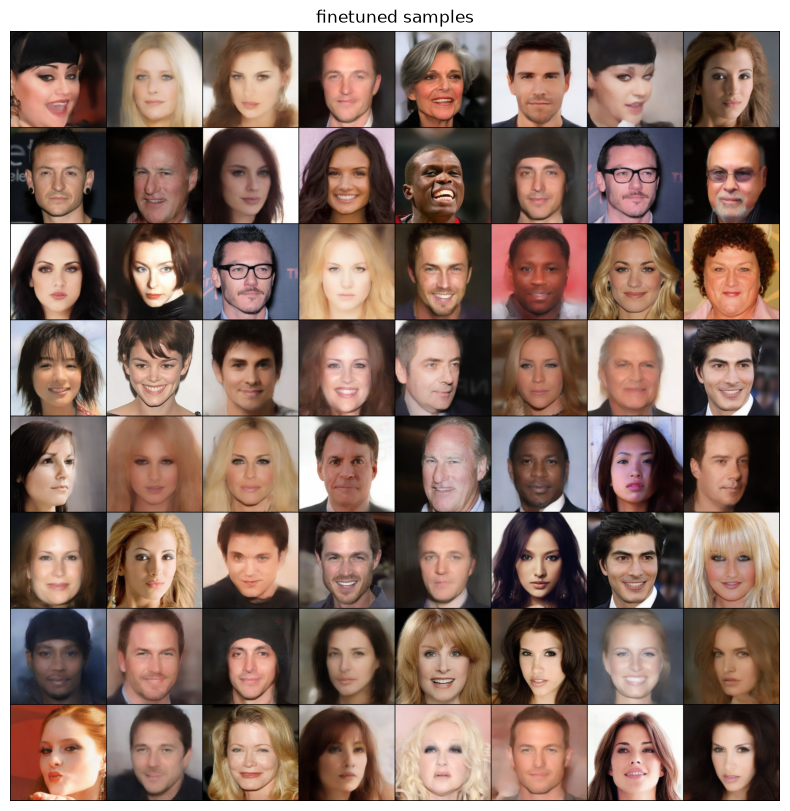

In [6]:
import matplotlib.pyplot as plt
from PIL import Image

plt.figure(figsize=(10, 10))
plt.imshow(Image.open(grid_path))
plt.axis("off")
plt.title(f"{MODEL} samples")
plt.show()

## Quick memorization check

Pixel-space L2 distance (on 64x64 thumbnails, flip-aware) from each freshly generated sample to every training image, plus the `d1/d2` ratio test (Carlini et al. 2023-style).

In [7]:
import numpy as np
import torch.nn.functional as F
from PIL import Image

TRAIN_IMAGES_DIR = "../../data/celeba_hq/images"
FINETUNE_IDX_PATH = f"{CLUSTER_CODES}/checkpoints/celeba_hq_finetune_train_idx.npy"
THUMB_RES = 64
RATIO_THRESHOLD = 1 / 3
TOP_K = 8

train_files = sorted(os.listdir(TRAIN_IMAGES_DIR))  # same order CelebAHQImages uses
n_train = len(train_files)

if MODEL == "finetuned":
    ft_latent_idx = np.load(FINETUNE_IDX_PATH)
    ft_image_idx = np.unique(ft_latent_idx % n_train)
    in_finetune_subset = torch.zeros(n_train, dtype=torch.bool)
    in_finetune_subset[torch.from_numpy(ft_image_idx)] = True
else:
    in_finetune_subset = torch.zeros(n_train, dtype=torch.bool)

print(f"comparing {n_eval} generated samples against {n_train} training images")

comparing 64 generated samples against 30000 training images


In [8]:
def load_thumb(path, res=THUMB_RES):
    img = Image.open(path).convert("RGB").resize((res, res), Image.LANCZOS)
    return torch.from_numpy(np.array(img)).permute(2, 0, 1)  # [3, res, res] uint8


def to_flat_pm1(thumb_uint8):
    return (thumb_uint8.float() / 127.5 - 1.0).flatten(1)


train_thumbs = torch.empty(n_train, 3, THUMB_RES, THUMB_RES, dtype=torch.uint8)
for i, fname in enumerate(train_files):
    train_thumbs[i] = load_thumb(os.path.join(TRAIN_IMAGES_DIR, fname))
    if i % 5000 == 0:
        print(f"{i}/{n_train}", flush=True)
train_flat = to_flat_pm1(train_thumbs)
print(f"training thumbnail bank: {tuple(train_thumbs.shape)}")

0/30000


5000/30000


10000/30000


15000/30000


20000/30000


25000/30000


training thumbnail bank: (30000, 3, 64, 64)


In [9]:
def d1_d2_from_dist(d):
    top = torch.topk(d, 2, dim=1, largest=False)
    return top.values[:, 0], top.values[:, 1], top.indices[:, 0]


gen_thumbs = F.interpolate(images, size=(THUMB_RES, THUMB_RES), mode="area")
gen_flat = gen_thumbs.flatten(1)
gen_flat_mirror = torch.flip(gen_thumbs, dims=[3]).flatten(1)

d_upright = torch.cdist(gen_flat, train_flat)
d_mirror = torch.cdist(gen_flat_mirror, train_flat)
d_gen = torch.minimum(d_upright, d_mirror)
matched_mirrored_all = d_mirror < d_upright

gen_d1, gen_d2, gen_nn_idx = d1_d2_from_dist(d_gen)
gen_matched_mirrored = matched_mirrored_all.gather(1, gen_nn_idx.unsqueeze(1)).squeeze(1)
gen_ratio = gen_d1 / gen_d2

is_memorized = gen_ratio < RATIO_THRESHOLD
n_memorized = int(is_memorized.sum())
print(f"memorized (ratio < {RATIO_THRESHOLD:.3f}): {n_memorized}/{n_eval} ({n_memorized / n_eval:.1%})")

nn_in_subset = in_finetune_subset[gen_nn_idx]
if MODEL == "finetuned":
    print(f"nearest match inside the finetune subset: {int(nn_in_subset.sum())}/{n_eval}")
    print(f"  of the {n_memorized} flagged: {int((is_memorized & nn_in_subset).sum())} in subset, "
          f"{int((is_memorized & ~nn_in_subset).sum())} outside (likely false positives)")

rank_order = torch.argsort(gen_d1).tolist()
for rank, i in enumerate(rank_order[:TOP_K]):
    flag = "MEMORIZED" if is_memorized[i] else "ok"
    tags = ("mirrored " if gen_matched_mirrored[i] else "") + ("in-subset" if nn_in_subset[i] else "OUT-of-subset")
    print(f"#{rank+1}  gen_idx={i:3d}  d1={gen_d1[i]:6.2f}  ratio={gen_ratio[i]:.3f}  "
          f"nearest_train={train_files[gen_nn_idx[i]]}  [{flag}, {tags}]")

memorized (ratio < 0.333): 7/64 (10.9%)
nearest match inside the finetune subset: 31/64
  of the 7 flagged: 7 in subset, 0 outside (likely false positives)
#1  gen_idx= 22  d1=  4.69  ratio=0.169  nearest_train=05590.jpg  [MEMORIZED, mirrored in-subset]
#2  gen_idx= 25  d1=  5.74  ratio=0.143  nearest_train=29662.jpg  [MEMORIZED, mirrored in-subset]
#3  gen_idx= 53  d1=  8.11  ratio=0.272  nearest_train=20136.jpg  [MEMORIZED, in-subset]
#4  gen_idx= 11  d1=  8.15  ratio=0.267  nearest_train=22963.jpg  [MEMORIZED, in-subset]
#5  gen_idx= 31  d1=  9.01  ratio=0.249  nearest_train=23258.jpg  [MEMORIZED, mirrored in-subset]
#6  gen_idx= 46  d1=  9.37  ratio=0.258  nearest_train=23258.jpg  [MEMORIZED, mirrored in-subset]
#7  gen_idx= 18  d1=  9.80  ratio=0.259  nearest_train=07152.jpg  [MEMORIZED, in-subset]
#8  gen_idx= 62  d1= 10.41  ratio=0.518  nearest_train=26674.jpg  [ok, mirrored in-subset]


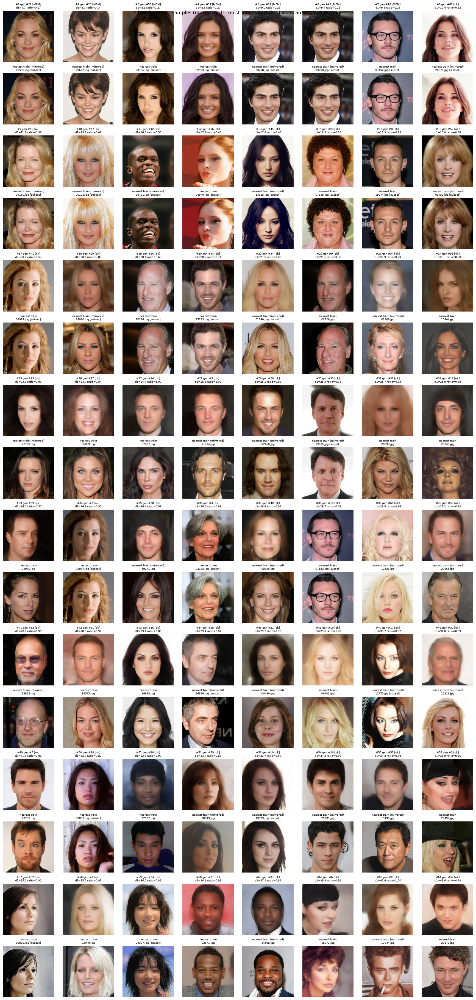

In [10]:
def to_display(img_pm1):
    return ((img_pm1.permute(1, 2, 0) + 1) / 2).clamp(0, 1).numpy()


N_COLS = 8
n_groups = (n_eval + N_COLS - 1) // N_COLS  # 8 groups of 8 for n_eval=64
fig, axes = plt.subplots(2 * n_groups, N_COLS, figsize=(2.2 * N_COLS, 2.3 * 2 * n_groups))
for rank, i in enumerate(rank_order):
    group, col = divmod(rank, N_COLS)
    row_gen, row_nn = 2 * group, 2 * group + 1

    axes[row_gen, col].imshow(to_display(images[i]))
    flag = "MEM" if is_memorized[i] else "ok"
    axes[row_gen, col].set_title(f"#{rank+1} gen #{i} [{flag}]\nd1={gen_d1[i]:.1f} ratio={gen_ratio[i]:.2f}", fontsize=7)
    axes[row_gen, col].axis("off")

    train_img = Image.open(os.path.join(TRAIN_IMAGES_DIR, train_files[gen_nn_idx[i]])).convert("RGB")
    if gen_matched_mirrored[i]:
        train_img = train_img.transpose(Image.FLIP_LEFT_RIGHT)
    axes[row_nn, col].imshow(np.array(train_img))
    subset_tag = " [subset]" if in_finetune_subset[gen_nn_idx[i]] else ""
    axes[row_nn, col].set_title(f"nearest train{' (mirrored)' if gen_matched_mirrored[i] else ''}\n"
                                f"{train_files[gen_nn_idx[i]]}{subset_tag}", fontsize=7)
    axes[row_nn, col].axis("off")

plt.suptitle(f"All {n_eval} {MODEL} samples (ranked by d1, most memorized first) vs. nearest training image")
plt.tight_layout()
plt.show()